## Card Image Classifier

### Overview
I'll be building an image classifer for playing cards. The data come
from [here](https://www.kaggle.com/datasets/gpiosenka/cards-image-datasetclassification/data). This notebook is meant to serve as a POC of my abilities in python to manipulate directories, build deep learning models using [fastai api](https://docs.fast.ai/), explain my methodolgy showcase my understanding of deep learning methods, save a deep learning model, and use jupyter notebooks. 

In [ ]:
#!pip install -U fastai


In [11]:
from fastai.vision.all import *
import numpy as np
import pandas as pd
import os
from pathlib import Path
import shutil
import torch

/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

### DataBlock configuration (Playing Cards Image Classification)

We will now build a fastai data block to use to train our model. Below is an outline of each argument, and the data augmentations to be executed in the training

- **`blocks=(ImageBlock, CategoryBlock)`**
  - Defines the input and output types.
  - `ImageBlock` tells fastai to expect image files as inputs.
  - `CategoryBlock` indicates a single categorical label per image (multiclass classification: 53 card classes).

- **`get_items=get_image_files`**
  - Recursively collects all image files from the dataset directory.
  - Works naturally with a folder-per-class layout (`<split>/<label>/<image>.jpg`).
  - Keeps the pipeline simple and filesystem-driven, which reduces labeling bugs.

- **`splitter=GrandparentSplitter(train_name="train", valid_name="valid")`**
  - Uses the existing folder structure to define training and validation splits.
  - Images under `train/` are used for training; images under `valid/` are used for validation.
  - Prevents accidental data leakage that can happen with random splitting when images are related.

- **`get_y=parent_label`**
  - Assigns labels based on the immediate parent folder name (e.g., `ace of spades`).

- **`item_tfms=Resize(224)`**
  - Resizes each image to a fixed resolution before batching.
  - Ensures the *entire card* stays in-frame, preserving corner rank/suit symbols.
  - Avoids destructive cropping that can remove the most informative parts of a playing card.
  - `224×224` matches the expected input size of ImageNet-pretrained ResNet models.

- **`batch_tfms=aug_transforms(...) + [Normalize.from_stats(*imagenet_stats)]`**
  - Applies data augmentations on GPU at the batch level for efficiency.
  - Increases robustness to real-world variation without changing card identity.
  - Includes ImageNet normalization so pretrained weights behave as intended.

#### Data Augmentations Used

- **`max_rotate=5`**
  - Allows small rotations (±5°).
  - Helps the model handle slightly tilted cards from handheld or casual photos.
  - Kept small to avoid unrealistic orientations that could confuse rank/suit patterns.

- **`max_zoom=1.05`**
  - Applies minor zoom-in variations.
  - Improves robustness to framing differences while keeping card edges visible.
  - Avoids cropping out corner symbols - **critical** for card identity.

- **`max_lighting=0.2`**
  - Adjusts brightness and contrast.
  - Simulates different lighting conditions (indoor, glare, shadows).
  - Particularly useful for glossy playing cards that reflect light unevenly.

- **`max_warp=0.0`**
  - Disables perspective warping.
  - Warping can distort suit icons and rank typography in unrealistic ways.
  - Best practice for rigid, planar objects like playing cards.

- **`flip_vert=False`**
  - Prevents vertical flipping.
  - Vertically flipped cards are unrealistic in most real-world card imagery.
  - We don't want to train 6's and have them look like 9s in augmentation!

- **`Normalize.from_stats(*imagenet_stats)`**
  - Normalizes images using ImageNet mean and standard deviation.
  - Required for effective transfer learning with pretrained ResNet models.



In [12]:

path = Path("/kaggle/input/cards-image-datasetclassification")

cards = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=GrandparentSplitter(train_name="train", valid_name="valid"),
    get_y=parent_label, # label = immediate parent folder (e.g., "ace of spades")
    item_tfms=Resize(224),
    batch_tfms=aug_transforms(
        max_rotate=5,
        max_zoom=1.05,
        max_lighting=0.2,
        max_warp=0.0,
        flip_vert=False
    ) + [Normalize.from_stats(*imagenet_stats)]
)

dls = cards.dataloaders(path)
print("num classes:", len(dls.vocab))

num classes: 53


Now, let's examine a batch of our training data. This provides a window into how the model "sees" the images during the training process.

To help the model generalize better, we use Data Augmentation. Instead of seeing the exact same image every time, the model sees a slightly modified version in every epoch (one complete pass of the dataset). By applying subtle rotations, adjusted lighting contrasts, and slight zooms, we force the neural network to learn the invariant features of the cards—like the shape of a suit or the font of a rank—rather than just memorizing a specific photo.

This holistic approach ensures the model remains robust when it encounters real-world images that may have different angles or lighting conditions than our original training set.

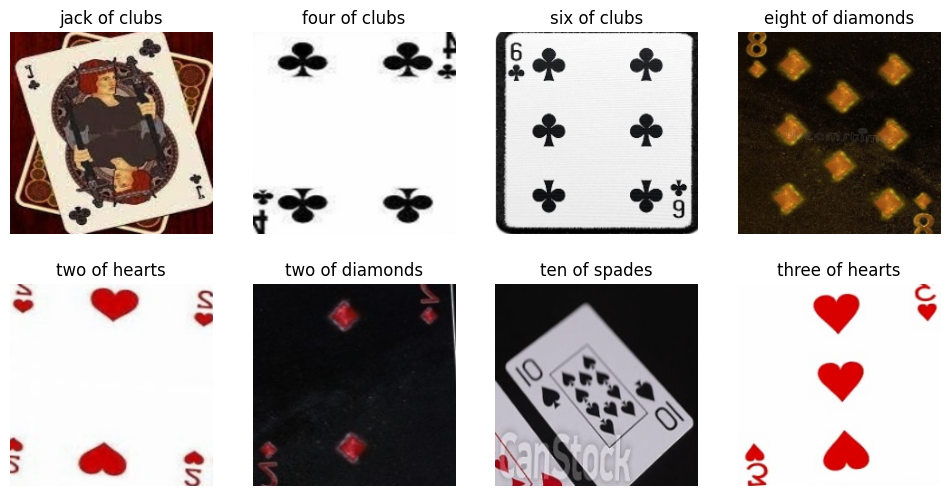

In [5]:
dls.train.show_batch(max_n=8, nrows=2)

Now we can train our model:

In [4]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(5)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 172MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,3.503050,2.043516,0.626415,00:24


epoch,train_loss,valid_loss,error_rate,time
0,1.819524,0.904636,0.264151,00:23
1,1.036837,0.451702,0.139623,00:23
2,0.562838,0.272588,0.090566,00:23
3,0.340326,0.242842,0.067925,00:23
4,0.223916,0.225599,0.075472,00:23


In the initial "freeze" phase (Epoch 0), the model begins with pre-trained weights from ImageNet but has a randomly initialized "head" specifically for our 53 card classes. As training progresses into the fine_tune stage, we see the Training Loss and Validation Loss steadily decrease. This is the result of the optimization algorithm (Adam) calculating the gradients of our loss function and updating the model's weights to find the global minimum.

The Error Rate—which tracks the percentage of cards the model misclassified—shows significant improvement, dropping from a 62.6% error to a low of 6.7% by Epoch 3. However, in the final epoch (Epoch 4), we notice the error rate regresses slightly to 7.5% while the training loss continues to drop. This divergence is a key indicator of overfitting, where the model begins to memorize the specific details of the training images rather than learning general patterns that apply to the validation set. We will update this and possibly make other improvements to see if we can obtain even more accuracy. Let's look at our models top losses, meaning the images that the model was certain it had right, but were actually wrong, and those that it had no strong conviction as to what it is actually classifying. By examining these specific images, we can determine if the model is struggling with visual similarities (like 6s vs. 9s), poor lighting, or perhaps even "ground truth" errors—where the original image in the dataset was labeled incorrectly by a human:



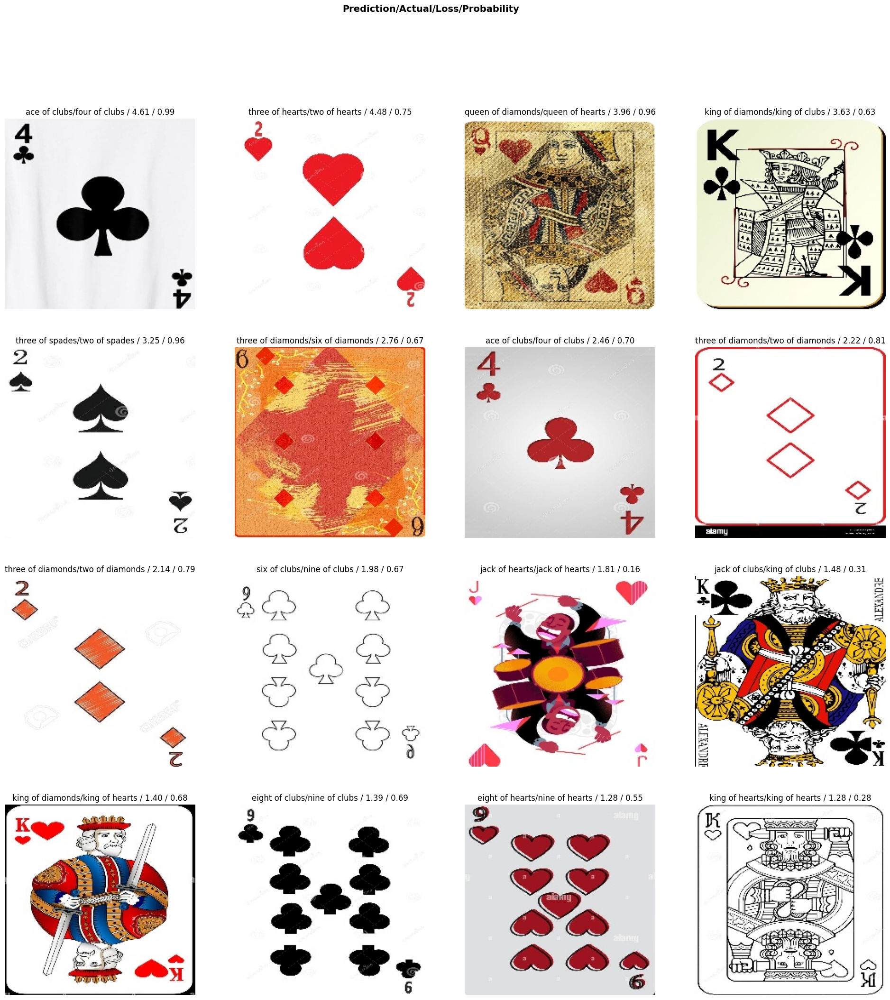

In [6]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(16, figsize=(24, 24))

## Model 1 Performance

~93% accuracy is pretty good. We can likely do better with a few updates. Observing the top losses plot, we see that the remaining misclassifications are concentrated in **non-standard or ambiguous card designs**, including:

- **Weird / novelty-looking cards**
  - Unusual artwork, typography, or layouts not well represented in the training set.
- **Unexpected suit coloring**
  - Examples like *red clubs* or other non-traditional color schemes.
- **Very small rank/suit symbols**
  - Especially tiny corner indices that may not be well-resolved at current image resolution.
- **Non-standard pip layouts**
  - Cards that should display multiple suit symbols (e.g., *4 of clubs*) but instead show:
    - A single large suit symbol
    - Minimalist or symbolic layouts that visually resemble other ranks (e.g., ace-like designs)

These errors are driven by distribution shift - a mismatch between the "standard" cards the model expects and the "novelty" cards it is being shown. The model hasn't "failed"; rather, it is being asked to classify images that contradict the rules it learned during training.

This suggests that further gains will likely come from:
- Higher-resolution inputs,
- Better coverage of non-standard card designs in training data,
- Or redefining the problem scope (e.g., handling novelty decks separately or focusing on corner indices).

### Improvement Strategy
To push the model’s accuracy further, I am upgrading the pipeline to handle 448x448 images. I am also implementing a more sophisticated transformation strategy:

    - `Resize(448, method='squish')`: Instead of cropping out the edges to fit a square, "squishing" ensures that the entire card—including all four corner indices—remains within the frame. This preserves the whole context of the card's layout.

    - `RandomResizedCrop(448, min_scale=0.3)`: During training, the model will randomly crop and zoom into different areas of the card, sometimes focusing entirely on a single suit symbol or a corner rank. 

The `min_scale` will also make the model focus on smaller sectons of the card in a way that is like a close up shot. Instead of relying on soley the card's position in the center of the frame, it will train on local features, like the specific curve of a 5 or the sharp edge of a spade. This will help resolve the distrubiton shift issue. One other important note, since the images are larger, we need to make our training batch sizes smaller Let's update our data block:

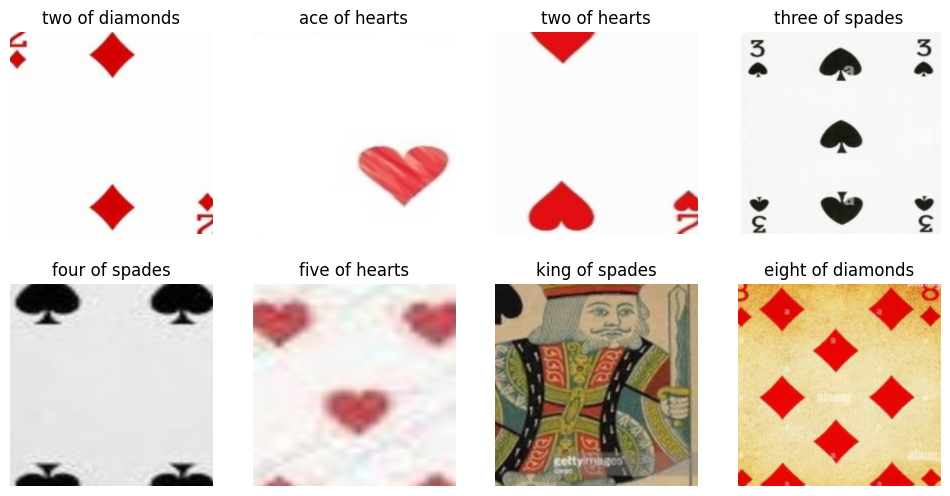

In [7]:
cards_new = cards.new(
    item_tfms=[Resize(448, method='squish'), RandomResizedCrop(448, min_scale=0.3)]
)
dls = cards_new.dataloaders(path, bs=16)
dls.train.show_batch(max_n=8, nrows=2)

We can see how different these images look than those in the first attempt!

In [9]:
learn = vision_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,3.250954,2.235050,0.705660,01:01


epoch,train_loss,valid_loss,error_rate,time
0,2.288535,1.190289,0.452830,01:20
1,1.662214,0.598023,0.200000,01:20
2,1.132483,0.271555,0.079245,01:20
3,0.917359,0.242160,0.071698,01:21


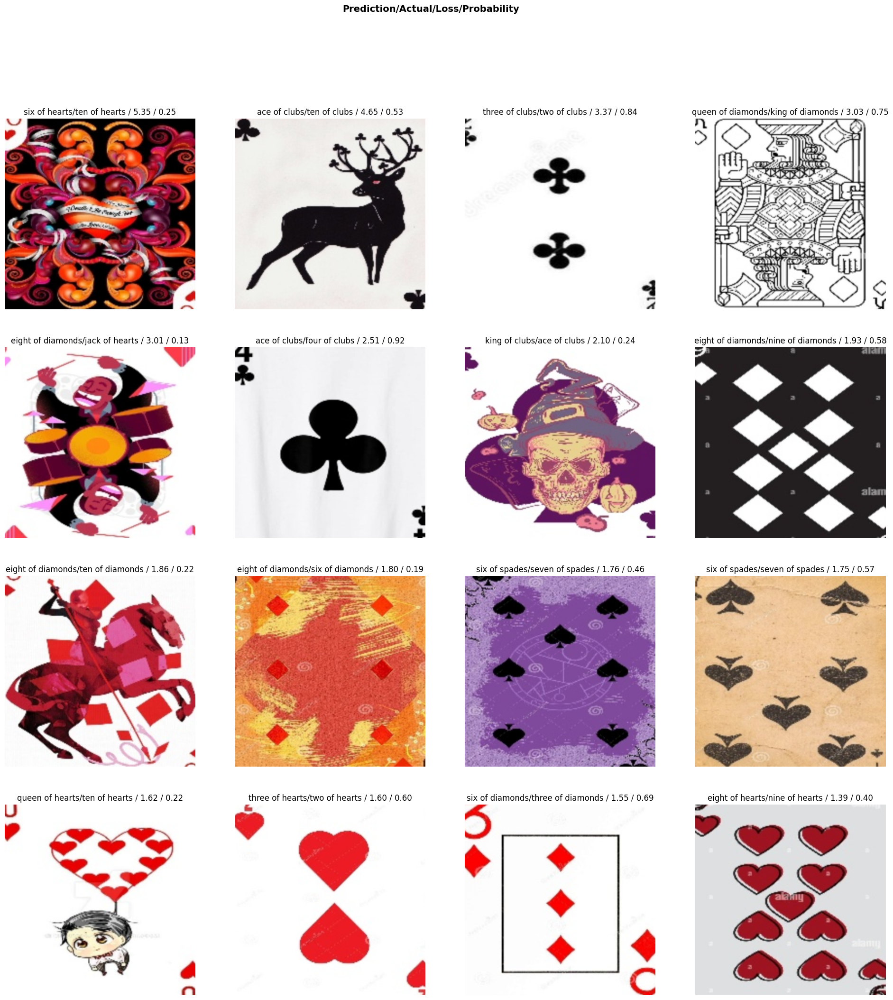

In [10]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(16, figsize=(24, 24))

## Model 2 Performance 

Here's my assesment of the two types of cards contributing to the `top_loses`:
1) **Novelty cards** (unusual artwork/typography/colors/layouts)
2) **Aggressive center zoom/crop** that drops the corner indices, causing wrong predictions

I'll update a third and final time to see if we can improve:

### Improvement Strategy

- Replace `method='squish'` with `ResizeMethod.Pad`
    - `squish` keeps corners in-frame but *distorts* typography and spacing.
    - `Pad` preserves aspect ratio and still keeps the full card (and corners) visible.
      
- Reduce “corner dropping” by increasing `min_scale
      -`RandomResizedCrop(..., min_scale=0.3)` Was too agressive in my last attempt - the value of 0.3 frequently produced tight crops that exclude corners.
    - Since corners carry the strongest class signal (rank + suit), we increase to `min_scale=0.8` so the model usually sees corners during training.
    - There will still be some crop/zoom variation, but it’s no longer the dominant view.

- Preserve corner readability with a larger item-stage resize
    - Corner indices are small. Using `Resize(512, ...)` before cropping to 448 helps keep those details legible after transforms.

- Slightly stronger but still controlled augmentation
    - A bit more rotation/warp helps with real-world photo angles.
    - This can help with novelty cards without reintroducing the “missing corners” issue.

-  `MixUp` for novelty-card robustness
    - Regularizes the classifier by blending examples and labels during training.
    - This typically improves generalization to out-of-distribution artwork (novelty cards) and reduces overconfidence on novelty cards—exactly what we’re seeing in `top_losses`.

Let's update the data block once more, and look at another batch:

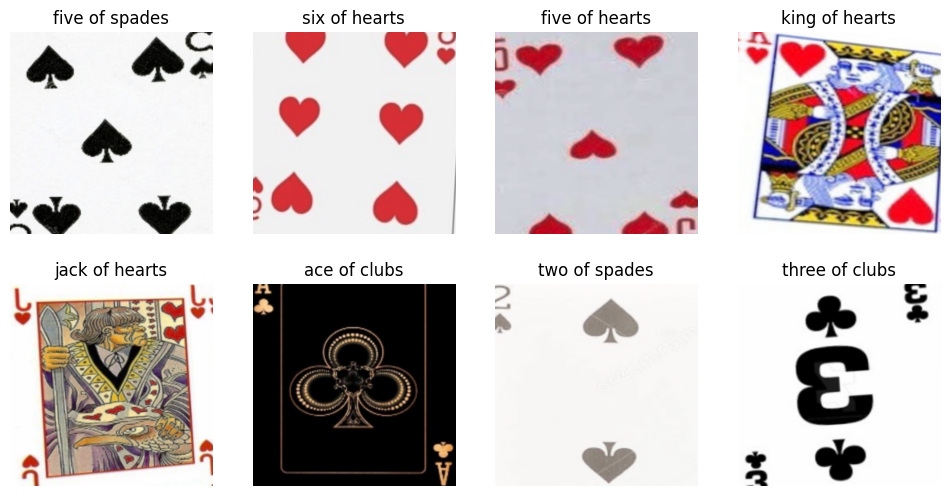

In [13]:
cards_corner_safe = cards.new(
    item_tfms=[
        Resize(512, method=ResizeMethod.Pad, pad_mode='zeros'),
        RandomResizedCrop(448, min_scale=0.8),
    ],
    batch_tfms=aug_transforms(
        size=448,
        min_scale=0.8,
        max_rotate=8,
        max_zoom=1.05,
        max_lighting=0.25,
        max_warp=0.05,
        flip_vert=False
    ) + [Normalize.from_stats(*imagenet_stats)]
)

dls = cards.dataloaders(path, bs=32)

dls.train.show_batch(max_n=8, nrows=2)



Now Let's train the model. I'm going to add epochs here because the novelty cards are a harder generalization problem. The model needs more exposure to these "unique" features. Also, because we're leveraging the `MixUp` function, the model will perform better with deeper training: 

In [14]:
learn = vision_learner(dls, resnet34, metrics=error_rate)

learn.add_cb(MixUp(alpha=0.2))

learn.fine_tune(8)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 208MB/s]


epoch,train_loss,valid_loss,error_rate,time
0,3.590620,2.527702,0.750943,00:59


epoch,train_loss,valid_loss,error_rate,time
0,2.536259,1.202953,0.384906,01:18
1,2.027856,0.828745,0.271698,01:18
2,1.666931,0.514524,0.154717,01:18
3,1.437979,0.267806,0.071698,01:18
4,1.261191,0.208586,0.049057,01:18
5,1.104734,0.167489,0.041509,01:19
6,0.996892,0.148172,0.033962,01:19
7,1.012629,0.146078,0.033962,01:19


A dramatic improvement, again let's look at the top loses:

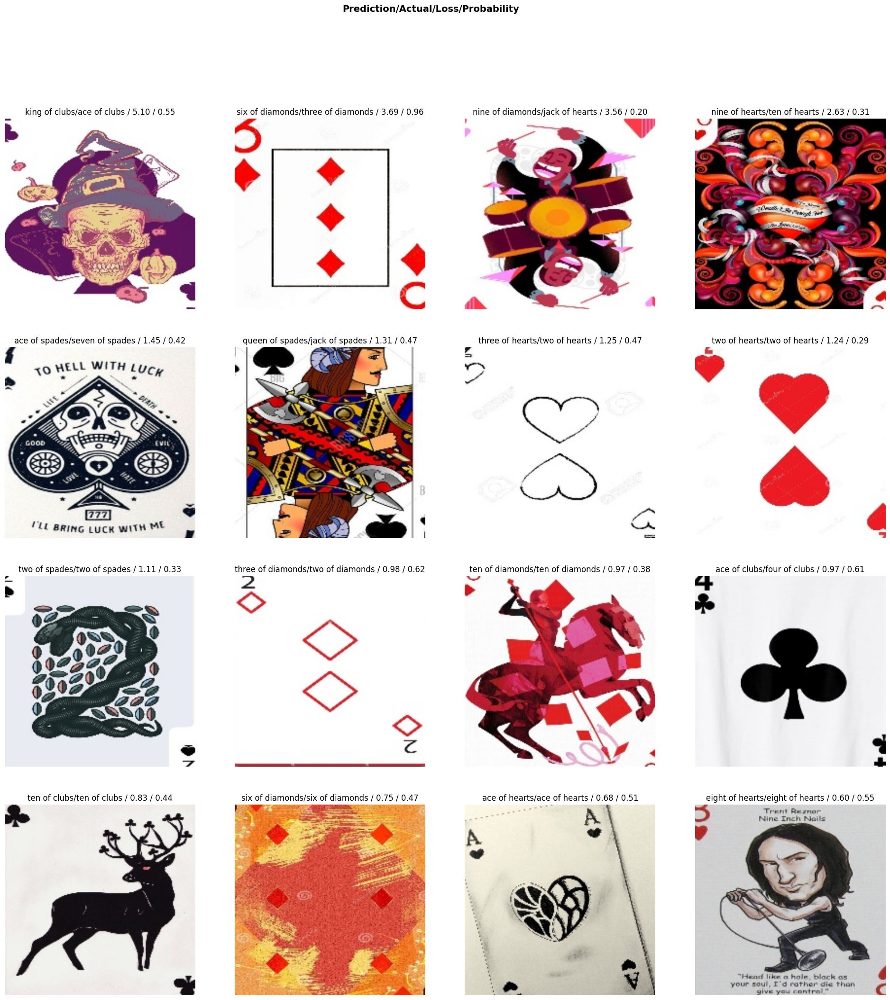

In [16]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_top_losses(16, figsize=(24, 24))

Many of the usual suspect cards appear to persist in the top losses. That said, we've built a much more accurate model overall. Notably, the model is now predicting the class of some previously troublesome novelty cards correctly, with relatively low confidence. To better understand this behavior, I'll inspect the top-loss examples alongside their top two predicted class probabilities, which provides insight into how ambiguous these predictions are.




In [17]:
# `losses` = tensor of loss values
# `idxs`   = indices of those samples in the validation dataset
losses, idxs = interp.top_losses(k=30)

# Get the full set of predicted probabilities and true targets
preds, targs = learn.get_preds()

# Iterate over the first 10 of the highest-loss samples
for i in idxs[:10]:

    # Probability vector for sample i across all classes
    p = preds[i]

    # Get the top 2 predicted class probabilities and their indices.
    top2 = torch.topk(p, 2)

    # Extract the top-1 and top-2 probabilities
    p1, p2 = top2.values.tolist()

    # Convert the predicted class index to the class name using the vocab
    pred_class = learn.dls.vocab[int(top2.indices[0])]

    # Convert the true target index to the class name
    true_class = learn.dls.vocab[int(targs[i])]

    # Print:
    # - true label
    # - predicted label (top-1)
    # - top-1 probability (model's confidence in its choice)
    # - top-2 probability (runner-up)
    # - margin = p1 - p2 (how decisively it chose the winner)
    print(f"true={true_class:20s} pred={pred_class:20s} p1={p1:.3f} p2={p2:.3f} margin={p1-p2:.3f}")

true=ace of clubs         pred=king of clubs        p1=0.553 p2=0.075 margin=0.478
true=three of diamonds    pred=six of diamonds      p1=0.964 p2=0.025 margin=0.939
true=jack of hearts       pred=nine of diamonds     p1=0.203 p2=0.074 margin=0.129
true=ten of hearts        pred=nine of hearts       p1=0.309 p2=0.148 margin=0.161
true=seven of spades      pred=ace of spades        p1=0.423 p2=0.234 margin=0.189
true=jack of spades       pred=queen of spades      p1=0.467 p2=0.269 margin=0.197
true=two of hearts        pred=three of hearts      p1=0.473 p2=0.288 margin=0.185
true=two of hearts        pred=two of hearts        p1=0.290 p2=0.245 margin=0.044
true=two of spades        pred=two of spades        p1=0.328 p2=0.129 margin=0.199
true=two of diamonds      pred=three of diamonds    p1=0.619 p2=0.375 margin=0.244


The output above reveals that some high-loss examples are correct but uncertain, indicating that novelty or non-standard layouts remain near the model’s decision boundary. However, a smaller subset of errors are confidently incorrect, suggesting that the model has occasionally learned misleading visual heuristics — such as relying on central pip layout rather than corner rank indices — when novelty designs minimize or stylize the corners. I'll now save the model to a .pkl file:

In [19]:
learn.export("/kaggle/working/card_model.pkl")
!ls /kaggle/working



card_model.pkl


## Conclusion: Model Performance and Residual Failure Modes

Following updates to the data pipeline — specifically preserving card aspect ratio via padding and reducing aggressive cropping that previously removed corner indices — the model demonstrated a substantial improvement in overall validation performance. Error rate declined meaningfully, suggesting that earlier misclassifications driven by partial views of the card were successfully mitigated. Inspection of the top-loss examples further confirmed that the model is now frequently able to correctly classify visually unconventional or novelty cards that it previously struggled with.

However, a closer analysis of these high-loss samples revealed two remaining and distinct failure modes. First, the model occasionally makes **low-confidence predictions on novelty or non-standard card designs**, even when the final classification is correct. These examples typically exhibit small probability margins between the top predicted classes, indicating that the model remains uncertain in the presence of unusual artwork, layouts, or typography. This suggests that while the model has improved its robustness to out-of-distribution visual styles, such examples still lie near the decision boundary and may be sensitive to small perturbations in framing or lighting.

Second, and more critically, a small subset of errors are **confident but incorrect predictions**, particularly in cases involving rank misclassification (e.g., predicting a six as a three). These errors are characterized by large probability margins in favor of the incorrect class, implying that the model has learned an overly simplistic or misleading visual heuristic — most likely relying on central pip layout rather than corner rank indices when the latter are visually minimized or stylized. Unlike low-confidence novelty errors, these mistakes reflect a structural bias in the learned feature representation rather than a lack of exposure alone.

Taken together, these findings indicate that the model performs strongly on standard card layouts and demonstrates improved resilience to novelty designs, but still exhibits sensitivity to rank representation in certain edge cases. Future improvements may be achieved through targeted augmentation of novelty cards with ambiguous central layouts or by implementing confidence-based abstention strategies in deployment scenarios. In particular, flagging low-confidence predictions for manual review offers a practical means of mitigating risk without requiring further architectural complexity.
